In [4]:
#libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

#pipelines
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer

#algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#validation metrics
from sklearn.metrics import f1_score, make_scorer
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.utils.multiclass import unique_labels

#persist model
import joblib

### DATA

In [5]:
from google.colab import files
files.upload()

Saving proyect_2_dataset.csv to proyect_2_dataset (1).csv


{'proyect_2_dataset.csv': b'Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow\n2008-12-01,Albury,13.4,22.9,0.6,,,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,,16.9,21.8,No,No\n2008-12-02,Albury,7.4,25.1,0.0,,,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,,,17.2,24.3,No,No\n2008-12-03,Albury,12.9,25.7,0.0,,,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,,2.0,21.0,23.2,No,No\n2008-12-04,Albury,9.2,28.0,0.0,,,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,,,18.1,26.5,No,No\n2008-12-05,Albury,17.5,32.3,1.0,,,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No\n2008-12-06,Albury,14.6,29.7,0.2,,,WNW,56.0,W,W,19.0,24.0,55.0,23.0,1009.2,1005.4,,,20.6,28.9,No,No\n2008-12-07,Albury,14.3,25.0,0.0,,,W,50.0,SW,W,20.0,24.0,49.0,19.0,1009.6,1008.2,1.0,,18.1,24.6,No,No\n2008-12-08,Albur

In [52]:
#Data upload
#path = '/Users/maria/OneDrive/Documentos/mlm/proyect_2_dataset.csv'
def load_data(filename):
    '''''subir datos '''''
    df = pd.read_csv(filename)
    df.drop(df.columns[0], axis=1, inplace=True)
    
    X = df.drop('RainTomorrow',axis=1)
    y = df['RainTomorrow']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=20)
    y_train = y_train.apply(lambda x: str(x))
    y_test = y_test.apply(lambda x: str(x))
    return X_train, y_train, X_test, y_test

X_train, y_train, X_test, y_test = load_data('proyect_2_dataset.csv')
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(98835, 21) (98835,) (42359, 21) (42359,)


In [7]:
#NAs management
samples = X_train.shape[0]
for col in X_train.columns:
    nas = X_train[col].isna().sum()
    percent = round(100*nas/samples,2)
    print('{0:<20} {1:<20} {2}%'.format(col,nas,percent))
#Every column has less than 50% nas so no column will be dropped
#Because of the distribution imputation is adequate

Location             0                    0.0%
MinTemp              999                  1.01%
MaxTemp              853                  0.86%
Rainfall             2210                 2.24%
Evaporation          42667                43.17%
Sunshine             47454                48.01%
WindGustDir          6920                 7.0%
WindGustSpeed        6871                 6.95%
WindDir9am           7200                 7.28%
WindDir3pm           2857                 2.89%
WindSpeed9am         1211                 1.23%
WindSpeed3pm         2060                 2.08%
Humidity9am          1773                 1.79%
Humidity3pm          3031                 3.07%
Pressure9am          10260                10.38%
Pressure3pm          10222                10.34%
Cloud9am             38000                38.45%
Cloud3pm             40318                40.79%
Temp9am              1184                 1.2%
Temp3pm              2431                 2.46%
RainToday            2210            

In [8]:
#checking X upload
X_train = X_train.loc[:,]
X_train.head(3)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
72140,Nhil,3.9,22.0,0.0,NaN,NaN,WSW,50.0,SSW,WSW,28.0,24.0,47.0,25.0,1023.5,1023.6,NaN,NaN,12.4,20.4,No
18927,NorahHead,20.3,27.9,0.0,NaN,NaN,NE,44.0,NNE,NE,26.0,30.0,72.0,67.0,1016.8,1014.4,NaN,NaN,22.9,25.0,No
27206,Richmond,6.0,15.7,0.0,3.6,NaN,WSW,50.0,NNE,W,11.0,28.0,50.0,39.0,1011.4,1011.6,NaN,NaN,11.6,14.6,No


### EXPLORATION

In [9]:
#Types of features and separation
num_features = X_train.select_dtypes(include='number').columns
cat_features = X_train.select_dtypes(exclude='number').columns

print('Numerical Features:')
for f in num_features:
    print(f,end=', ')
print('\n\nCategorical Features:')
for f in cat_features:
    print(f,end=', ')

Numerical Features:
MinTemp, MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, WindSpeed3pm, Humidity9am, Humidity3pm, Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, 

Categorical Features:
Location, WindGustDir, WindDir9am, WindDir3pm, RainToday, 

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fbe9e17d9d0>,
      dtype=object)

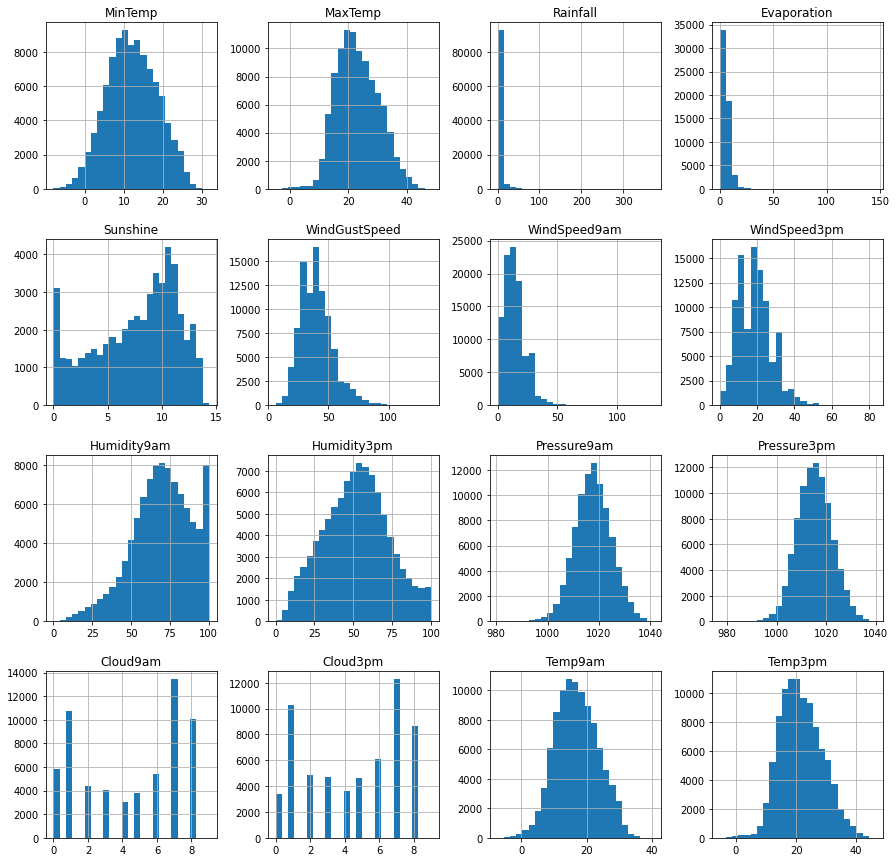

In [10]:
#data distribution
X_train.hist(figsize=(15,15),bins=25)

### PIPELINES

In [11]:
#Numeric pipeline
num_pipeline = Pipeline([('imputer', SimpleImputer(strategy="median")),
                         ('std_scaler', StandardScaler())])

In [12]:
#Categorical pipeline
cat_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy="most_frequent")),
        ('oh_enc', OneHotEncoder()),
    ])

In [13]:
#Merge of numeric and categorical pipelines: preprocessing pipeline
preprocessing = ColumnTransformer([("num", num_pipeline, num_features),
                                   ("cat", cat_pipeline, cat_features),
                                  ])

### PIPELINES TESTING

In [14]:
#Numeric pipeline testing
X_train_num = X_train[num_features]

print(X_train_num.shape)
X_train_tr = num_pipeline.fit_transform(X_train_num)
print(X_train_tr.shape)

X_train_tr[0]

(98835, 16)
(98835, 16)


array([-1.30290728, -0.17278401, -0.27466715, -0.11727602,  0.1654881 ,
        0.7672523 ,  1.5832883 ,  0.61356822, -1.15885248, -1.29564151,
        0.86975507,  1.2532677 ,  0.15183772,  0.14012278, -0.71154197,
       -0.18595155])

In [15]:
#Categorical pipeline testing
X_train_cat = X_train[cat_features]
df_cat_tr = cat_pipeline.fit_transform(X_train_cat)
df_cat_tr.toarray()[0,:]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0.])

In [53]:
#Preprocessing pipeline testing
X_train_raw, y_train_raw, X_test_raw, y_test_raw = load_data('proyect_2_dataset.csv')

X_train_processed = preprocessing.fit_transform(X_train_raw)
print(X_train_processed.shape)
X_train_processed[0,:].toarray()[0,:]

(98835, 115)


array([-1.30290728, -0.17278401, -0.27466715, -0.11727602,  0.1654881 ,
        0.7672523 ,  1.5832883 ,  0.61356822, -1.15885248, -1.29564151,
        0.86975507,  1.2532677 ,  0.15183772,  0.14012278, -0.71154197,
       -0.18595155,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  1.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

### OPTIMAL MODELS

In [17]:
#classification score
f1 = make_scorer(f1_score , average='macro')

#### SVM Classifier

In [18]:
#algorithm and para meters
log_reg = LogisticRegression()
log_reg.get_params().keys()

dict_keys(['C', 'class_weight', 'dual', 'fit_intercept', 'intercept_scaling', 'l1_ratio', 'max_iter', 'multi_class', 'n_jobs', 'penalty', 'random_state', 'solver', 'tol', 'verbose', 'warm_start'])

In [19]:
#parameters
param_grid1 = [{
    'solver': ['liblinear','saga'],
    'penalty': ['l1'],
    'C': [0.001,0.01,0.1,1],
    'random_state': [42]
}]

In [20]:
#cv to determine best model possible
grid_search1 = GridSearchCV(log_reg, param_grid1, cv=5,
                           scoring=f1,
                           return_train_score=True,
                           verbose=1,n_jobs=-1)

In [21]:
grid_search1.fit(X_train_processed, y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed: 11.6min finished
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid=[{'C': [0.001, 0.01, 0.1, 1], 'penalty': ['l1'],
                          'random_state': [42],
                          'solver': ['liblinear', 'saga']}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=make_scorer(f1_score, average=macro), verbose=1)

In [22]:
#get best parameter set
grid_search1.best_params_

{'C': 1, 'penalty': 'l1', 'random_state': 42, 'solver': 'saga'}

In [23]:
#Apply best parameter
best_model_logreg = grid_search1.best_estimator_
best_model_logreg

LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=42, solver='saga', tol=0.0001, verbose=0,
                   warm_start=False)

In [24]:
#model predictions test
X_test_processed = preprocessing.transform(X_test_raw)
pred1 = best_model_logreg.predict(X_test_processed)
pred1

array(['No', 'No', 'No', ..., 'Yes', 'No', 'No'], dtype=object)

#### SVM classifier

In [25]:
svm = SVC()
svm.get_params().keys()

dict_keys(['C', 'break_ties', 'cache_size', 'class_weight', 'coef0', 'decision_function_shape', 'degree', 'gamma', 'kernel', 'max_iter', 'probability', 'random_state', 'shrinking', 'tol', 'verbose'])

In [33]:
param_grid2 = [{'C': [0.1, 1, 10, 100],  
              'gamma': [1, 0.1, 0.01, 0.001], 
              'kernel': ['rbf'],
              'random_state': [42]}]  
  
grid_search2 = GridSearchCV(svm, param_grid2, cv = 2, scoring=f1,
                           return_train_score=True, refit = True, verbose = 3, n_jobs=-1)

In [34]:
grid_search2.fit(X_train_processed, y_train)

Fitting 2 folds for each of 16 candidates, totalling 32 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


KeyboardInterrupt: ignored

In [ ]:
grid_search2.best_params_

In [ ]:
best_model_svm = grid_search2.best_estimator_
best_model_svm

In [ ]:
#X_test_processed = full_pipeline.transform(X_test_raw)
pred2 = best_model_svm.predict(X_test_processed)
pred2

#### Decision Tree

In [35]:
param_grid = [ {'criterion': ['gini', 'entropy'],
                'splitter': ['best','random'],
                'max_depth': [3,5,6], 'min_samples_leaf': [3, 10, 12, 20]},
             ]

# create instance
tree_cl = DecisionTreeClassifier(random_state=42)

# define scoring function
f1 = make_scorer(f1_score , average='macro')

# search for best solution from combinations using a defined score function
grid_search = GridSearchCV(tree_cl, param_grid, cv=10,
                           scoring=f1,
                           return_train_score=True,
                           verbose=1,n_jobs=-1)

grid_search.fit(X_train_processed, y_train)

Fitting 10 folds for each of 48 candidates, totalling 480 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   55.2s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 480 out of 480 | elapsed: 11.1min finished


GridSearchCV(cv=10, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=42,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid=[{'criterion': ['gini', 'entropy'],
                     

In [36]:
grid_search.best_params_

{'criterion': 'gini',
 'max_depth': 6,
 'min_samples_leaf': 12,
 'splitter': 'best'}

In [44]:
best_model_treecl = grid_search.best_estimator_
best_model_treecl

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=12, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [41]:
# test processing pipeline and model
X_test_processed = preprocessing.transform(X_test_raw)
pred3 = best_model.predict(X_test_processed)
pred3

array(['No', 'No', 'No', ..., 'Yes', 'No', 'No'], dtype=object)

## TEST MODELOS 

In [42]:
#Logistic Regression classifications
print("CALIFICACION MODELO DECISION TREE: \n", classification_report(pred1, y_test))

CALIFICACION MODELO DECISION TREE: 
               precision    recall  f1-score   support

          No       0.94      0.85      0.89     35656
         Yes       0.50      0.72      0.59      6547
         nan       0.05      0.31      0.09       156

    accuracy                           0.82     42359
   macro avg       0.50      0.62      0.52     42359
weighted avg       0.87      0.82      0.84     42359



In [ ]:
#SVM classifications
print("CALIFICACION MODELO DECISION TREE: \n", classification_report(pred2, y_test))

In [43]:
#Decision tree classifications
print("CALIFICACION MODELO DECISION TREE: \n", classification_report(final_predictions, y_test))

CALIFICACION MODELO DECISION TREE: 
               precision    recall  f1-score   support

          No       0.95      0.84      0.89     36373
         Yes       0.44      0.71      0.55      5824
         nan       0.15      0.87      0.25       162

    accuracy                           0.82     42359
   macro avg       0.51      0.81      0.56     42359
weighted avg       0.88      0.82      0.84     42359



### BEST MODEL FOR DATA

In [54]:
#final pipeline with best classification algorithm
classification_pipeline = Pipeline([ ("data_preprocessing", preprocessing),
                                          ("tree_cl", best_model_treecl)])


classification_pipeline.fit(X_train_raw, y_train_raw)
classification_pipeline.predict(X_test_raw)

array(['No', 'No', 'No', ..., 'Yes', 'No', 'No'], dtype=object)

### MODEL PERSISTENCE

In [ ]:
my_model = classification_pipeline

# persist model to file
joblib.dump(classification_pipeline, "marianna_flores.pkl")

### VERIFICATION

In [ ]:
# load from disk
classification_model_loaded = joblib.load("marianna_flores.pkl")

In [ ]:
!ls

In [ ]:
classification_model_loaded.predict(X_test_raw)